In [ ]:
from transformers import Wav2Vec2ForCTC, Wav2Vec2Tokenizer

model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-base-960h")
tokenizer = Wav2Vec2Tokenizer.from_pretrained("facebook/wav2vec2-base-960h")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:88: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/378M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/wav2vec2-base-960h were not used when initializing Wav2Vec2ForCTC: ['wav2vec2.encoder.pos_conv_embed.conv.weight_v', 'wav2vec2.encoder.pos_conv_embed.conv.weight_g']
- This IS expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing Wav2Vec2ForCTC from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-base-960h and are newly initialized: ['wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original0', 'wav2vec2.masked_spec_embed', 'wav2vec2.encoder.pos_conv_embed.conv.parametrizations.weight.original1']
You sho

tokenizer_config.json:   0%|          | 0.00/163 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/291 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

The tokenizer class you load from this checkpoint is not the same type as the class this function is called from. It may result in unexpected tokenization. 
The tokenizer class you load from this checkpoint is 'Wav2Vec2CTCTokenizer'. 
The class this function is called from is 'Wav2Vec2Tokenizer'.
/usr/local/lib/python3.10/dist-packages/transformers/models/wav2vec2/tokenization_wav2vec2.py:733: FutureWarning: The class `Wav2Vec2Tokenizer` is deprecated and will be removed in version 5 of Transformers. Please use `Wav2Vec2Processor` or `Wav2Vec2CTCTokenizer` instead.
  warnings.warn(


In [ ]:
import torchaudio
from torch.utils.data import DataLoader

librispeech_train = torchaudio.datasets.LIBRISPEECH(".", url="train-clean-100", download=True)

In [ ]:
# Choose an example from the dataset
example_idx = 0
example_entry = librispeech_train[example_idx]

# Print the entry to understand its structure
print("LibriSpeech Example Entry:", example_entry)

LibriSpeech Example Entry: (tensor([[-0.0065, -0.0055, -0.0062,  ...,  0.0033,  0.0005, -0.0095]]), 16000, 'CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK', 103, 1240, 0)


In [ ]:
import torch

# Set the number of examples (n) you want to process
n = 5

# Loop through the first n examples in the dataset
for example_idx in range(n):
    # Choose an example from the dataset
    waveform, sample_rate, transcript, _, _, _ = librispeech_train[example_idx]

    # Tokenize input audio
    input_values = tokenizer(waveform.numpy(), return_tensors="pt").input_values

    # Forward pass through the model
    with torch.no_grad():
        logits = model(input_values).logits

    # Get the predicted tokens
    predicted_ids = torch.argmax(logits, dim=-1)

    # Decode the predicted tokens
    predicted_text = tokenizer.batch_decode(predicted_ids, skip_special_tokens=True)

    # Print the results for each example
    print(f"\nExample {example_idx + 1}:")
    print("Original Audio Shape:", waveform.shape)
    print("Sample Rate:", sample_rate)
    print("Transcript:", transcript)
    print("Predicted Tokens:", predicted_ids.squeeze().numpy())
    print("Decoded Text:", predicted_text[0])


Example 1:
Original Audio Shape: torch.Size([1, 225360])
Sample Rate: 16000
Transcript: CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK
Predicted Tokens: [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 19 11 11  0  0  0  7 23 23  0  6  6  5  5 13  0  4  4  0  0  0  0  0  8
  9  9  5  4  4  4  4  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0 17 17 10 10 12  0  0 12 12 16 16 12 12  4  4  4  0 13  0  0
  7  7  0 19 19 11 11  5  5 15 15 15  4  4  4 15 15  0 22  0  9  0  0 14
 14  5  5  4  4  4  0  0  0  0  0  0 10 12  0  4  0 12  0 16 13  0  0 23
 13 13  0  0  0  0  0  0 10  0  0 12  0  5  5 14 14  4  4  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0 

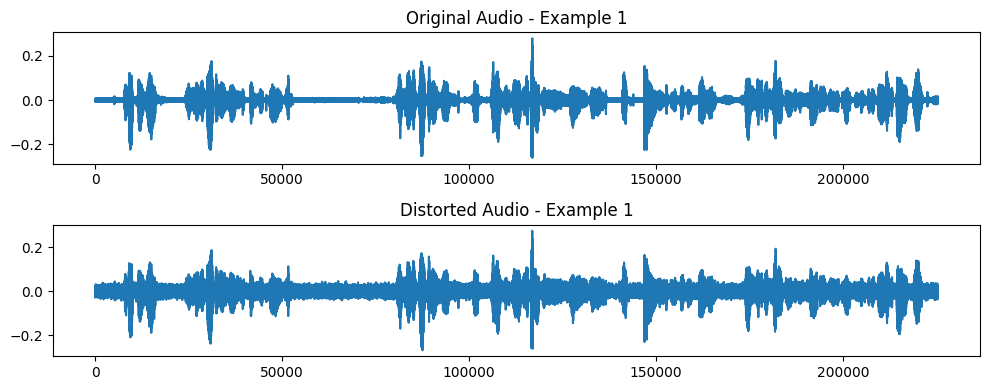

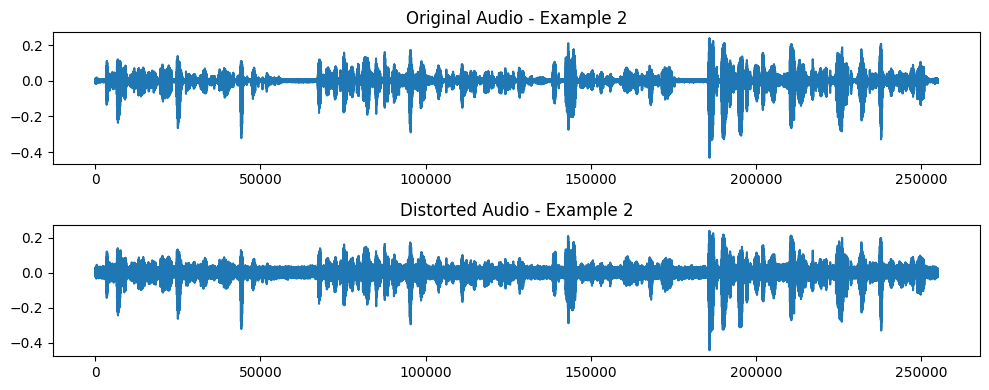

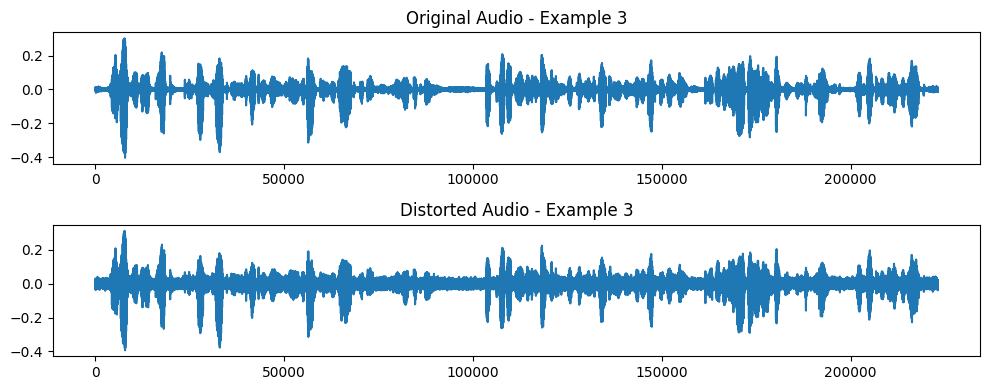

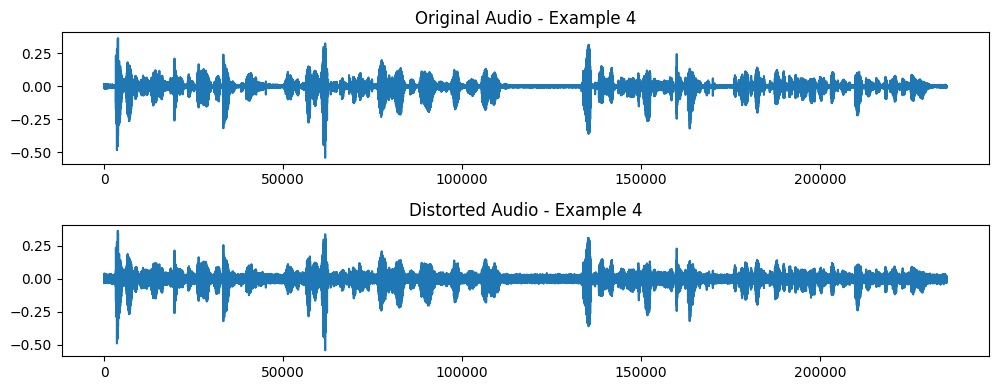

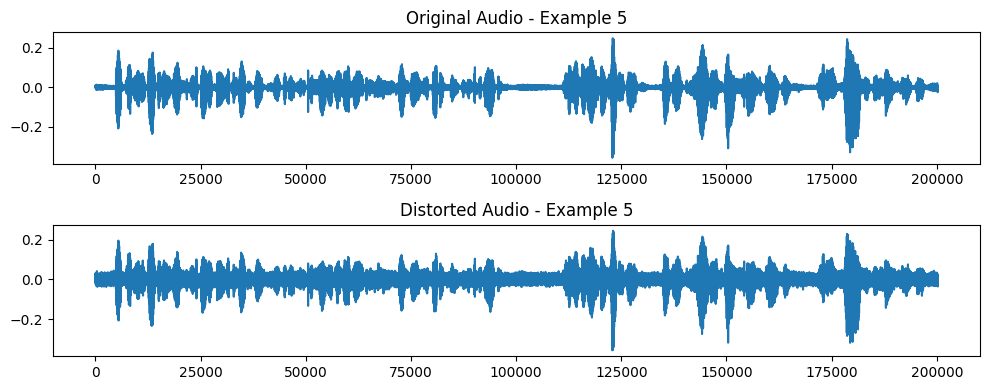

In [ ]:
import torch
import torchaudio
import torchaudio.transforms as T
import matplotlib.pyplot as plt

# Function to add distortion to audio waveform
def add_distortion(waveform, noise_level=0.01):
    noise = torch.randn_like(waveform) * noise_level
    return waveform + noise

# Loop through the first 5 examples in the dataset
for example_idx in range(5):
    # Choose an example from the dataset
    waveform, sample_rate, _, _, _, _ = librispeech_train[example_idx]

    # Add distortion to the audio waveform
    distorted_waveform = add_distortion(waveform, noise_level=0.01)  # Adjust noise_level as needed

    # Plot original and distorted waveforms
    plt.figure(figsize=(10, 4))
    plt.subplot(2, 1, 1)
    plt.plot(waveform.numpy().squeeze())
    plt.title(f'Original Audio - Example {example_idx + 1}')

    plt.subplot(2, 1, 2)
    plt.plot(distorted_waveform.numpy().squeeze())
    plt.title(f'Distorted Audio - Example {example_idx + 1}')

    plt.tight_layout()
    plt.show()

    # Save the distorted waveform as an audio file
    torchaudio.save(f'distorted_example_{example_idx + 1}.wav', distorted_waveform, sample_rate)

# After running the code, you can play the saved audio files using an external audio player.

In [ ]:
from IPython.display import Audio, display
import torchaudio
import torchaudio.transforms as T
import matplotlib.pyplot as plt

# Function to add distortion to audio waveform
def add_distortion(waveform, noise_level=0.05):
    noise = torch.randn_like(waveform) * noise_level
    return waveform + noise

# Loop through the first 5 examples in the dataset
for example_idx in range(5):
    # Choose an example from the dataset
    waveform, sample_rate, transcript, _, _, _ = librispeech_train[example_idx]

    # Add distortion to the audio waveform
    distorted_waveform = add_distortion(waveform, noise_level=0.01)  # Adjust noise_level as needed

    # Display the original audio with name
    print(f"\nOriginal Audio - Example {example_idx + 1} ({transcript}):")
    display(Audio(waveform.numpy().squeeze(), rate=sample_rate, autoplay=True))

    # Display the distorted audio with name
    print(f"\nDistorted Audio - Example {example_idx + 1} ({transcript}):")
    display(Audio(distorted_waveform.numpy().squeeze(), rate=sample_rate, autoplay=True))

    # Save the distorted waveform as an audio file
    torchaudio.save(f'distorted_example_{example_idx + 1}.wav', distorted_waveform, sample_rate)


Original Audio - Example 1 (CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK):



Distorted Audio - Example 1 (CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK):



Original Audio - Example 2 (THAT HAD ITS SOURCE AWAY BACK IN THE WOODS OF THE OLD CUTHBERT PLACE IT WAS REPUTED TO BE AN INTRICATE HEADLONG BROOK IN ITS EARLIER COURSE THROUGH THOSE WOODS WITH DARK SECRETS OF POOL AND CASCADE BUT BY THE TIME IT REACHED LYNDE'S HOLLOW IT WAS A QUIET WELL CONDUCTED LITTLE STREAM):



Distorted Audio - Example 2 (THAT HAD ITS SOURCE AWAY BACK IN THE WOODS OF THE OLD CUTHBERT PLACE IT WAS REPUTED TO BE AN INTRICATE HEADLONG BROOK IN ITS EARLIER COURSE THROUGH THOSE WOODS WITH DARK SECRETS OF POOL AND CASCADE BUT BY THE TIME IT REACHED LYNDE'S HOLLOW IT WAS A QUIET WELL CONDUCTED LITTLE STREAM):



Original Audio - Example 3 (FOR NOT EVEN A BROOK COULD RUN PAST MISSUS RACHEL LYNDE'S DOOR WITHOUT DUE REGARD FOR DECENCY AND DECORUM IT PROBABLY WAS CONSCIOUS THAT MISSUS RACHEL WAS SITTING AT HER WINDOW KEEPING A SHARP EYE ON EVERYTHING THAT PASSED FROM BROOKS AND CHILDREN UP):



Distorted Audio - Example 3 (FOR NOT EVEN A BROOK COULD RUN PAST MISSUS RACHEL LYNDE'S DOOR WITHOUT DUE REGARD FOR DECENCY AND DECORUM IT PROBABLY WAS CONSCIOUS THAT MISSUS RACHEL WAS SITTING AT HER WINDOW KEEPING A SHARP EYE ON EVERYTHING THAT PASSED FROM BROOKS AND CHILDREN UP):



Original Audio - Example 4 (AND THAT IF SHE NOTICED ANYTHING ODD OR OUT OF PLACE SHE WOULD NEVER REST UNTIL SHE HAD FERRETED OUT THE WHYS AND WHEREFORES THEREOF THERE ARE PLENTY OF PEOPLE IN AVONLEA AND OUT OF IT WHO CAN ATTEND CLOSELY TO THEIR NEIGHBOR'S BUSINESS BY DINT OF NEGLECTING THEIR OWN):



Distorted Audio - Example 4 (AND THAT IF SHE NOTICED ANYTHING ODD OR OUT OF PLACE SHE WOULD NEVER REST UNTIL SHE HAD FERRETED OUT THE WHYS AND WHEREFORES THEREOF THERE ARE PLENTY OF PEOPLE IN AVONLEA AND OUT OF IT WHO CAN ATTEND CLOSELY TO THEIR NEIGHBOR'S BUSINESS BY DINT OF NEGLECTING THEIR OWN):



Original Audio - Example 5 (BUT MISSUS RACHEL LYNDE WAS ONE OF THOSE CAPABLE CREATURES WHO CAN MANAGE THEIR OWN CONCERNS AND THOSE OF OTHER FOLKS INTO THE BARGAIN SHE WAS A NOTABLE HOUSEWIFE HER WORK WAS ALWAYS DONE AND WELL DONE SHE RAN THE SEWING CIRCLE):



Distorted Audio - Example 5 (BUT MISSUS RACHEL LYNDE WAS ONE OF THOSE CAPABLE CREATURES WHO CAN MANAGE THEIR OWN CONCERNS AND THOSE OF OTHER FOLKS INTO THE BARGAIN SHE WAS A NOTABLE HOUSEWIFE HER WORK WAS ALWAYS DONE AND WELL DONE SHE RAN THE SEWING CIRCLE):



Example 1 - CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK:
Original Audio Shape: torch.Size([1, 225360])
Distorted Audio Shape: torch.Size([1, 225360])
Sample Rate: 16000
Original Predicted Tokens: [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
 19 11 11  0  0  0  7 23 23  0  6  6  5  5 13  0  4  4  0  0  0  0  0  8
  9  9  5  4  4  4  4  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0 17 17 10 10 12  0  0 12 12 16 16 12 12  4  4  4  0 13  0  0
  7  7  0 19 19 11 11  5  5 15 15 15  4  4  4 15 15  0 22  0  9  0  0 14
 14  5  5  4  4  4  0  0  0  0  0  0 10 12  0  4  0 12  0 16 13  0  0 23
 13 13  0  0  0  0  0  0 10  0  0 12  0  5  5 14 14  4  4  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 

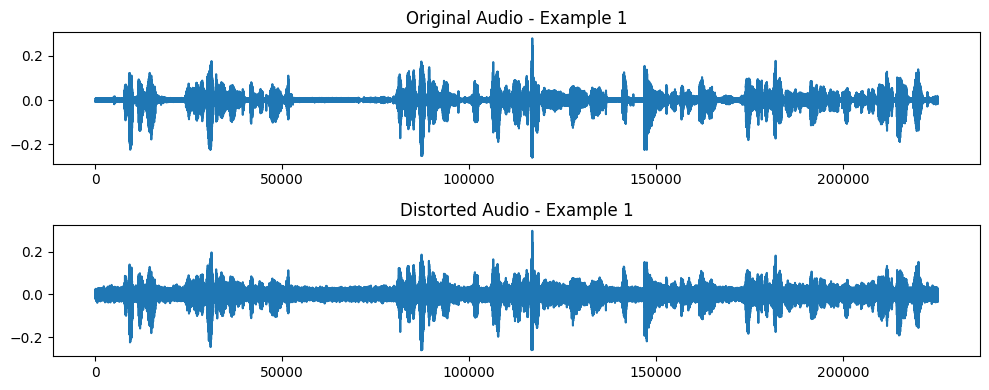


Original Audio - Example 1 (CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK):



Distorted Audio - Example 1 (CHAPTER ONE MISSUS RACHEL LYNDE IS SURPRISED MISSUS RACHEL LYNDE LIVED JUST WHERE THE AVONLEA MAIN ROAD DIPPED DOWN INTO A LITTLE HOLLOW FRINGED WITH ALDERS AND LADIES EARDROPS AND TRAVERSED BY A BROOK):



Example 2 - THAT HAD ITS SOURCE AWAY BACK IN THE WOODS OF THE OLD CUTHBERT PLACE IT WAS REPUTED TO BE AN INTRICATE HEADLONG BROOK IN ITS EARLIER COURSE THROUGH THOSE WOODS WITH DARK SECRETS OF POOL AND CASCADE BUT BY THE TIME IT REACHED LYNDE'S HOLLOW IT WAS A QUIET WELL CONDUCTED LITTLE STREAM:
Original Audio Shape: torch.Size([1, 255120])
Distorted Audio Shape: torch.Size([1, 255120])
Sample Rate: 16000
Original Predicted Tokens: [ 0  0  0  0  0  0  0  0  6 11  0  7  6  6  4  4  0 11 11  0  0  7  7  0
 14  0  4  4  0 10  6  6 12 12  4  4  0  0 12  0  0  0  0  8 16  0 13 13
  0  0 19  5  5  4  4  0  0  7  0  0  0 18  0  0  0  0  0  7 22 22  0  4
  4  4  0  0 24  0  0  0  7 19  0 26 26  0  4  4 10  9  4  4  4  6 11  5
  4  4 18 18  8  8  0  0  8  8 14  0 12 12  4  4  0  8 20  4  4  6 11  5
  5  4  4  0  8  8 15 15 14 14  0  4  4  0 19  0  0  0 16  0  6  6 11 11
  0  0 24  0  5  5 13  0  0  6  0  0  4  0 23  0 15  0  0  0  0  7  0  0
 19  5  5  4  4  0  0  0  0  0  0  0  0  0  0  0  0 

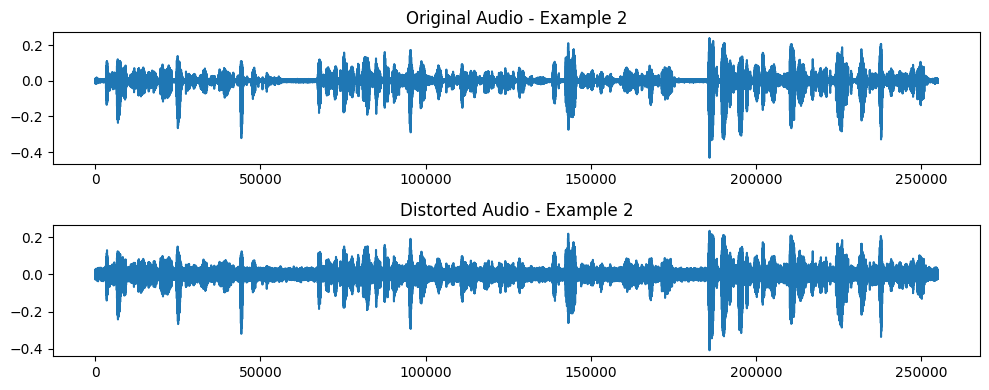


Original Audio - Example 2 (THAT HAD ITS SOURCE AWAY BACK IN THE WOODS OF THE OLD CUTHBERT PLACE IT WAS REPUTED TO BE AN INTRICATE HEADLONG BROOK IN ITS EARLIER COURSE THROUGH THOSE WOODS WITH DARK SECRETS OF POOL AND CASCADE BUT BY THE TIME IT REACHED LYNDE'S HOLLOW IT WAS A QUIET WELL CONDUCTED LITTLE STREAM):



Distorted Audio - Example 2 (THAT HAD ITS SOURCE AWAY BACK IN THE WOODS OF THE OLD CUTHBERT PLACE IT WAS REPUTED TO BE AN INTRICATE HEADLONG BROOK IN ITS EARLIER COURSE THROUGH THOSE WOODS WITH DARK SECRETS OF POOL AND CASCADE BUT BY THE TIME IT REACHED LYNDE'S HOLLOW IT WAS A QUIET WELL CONDUCTED LITTLE STREAM):



Example 3 - FOR NOT EVEN A BROOK COULD RUN PAST MISSUS RACHEL LYNDE'S DOOR WITHOUT DUE REGARD FOR DECENCY AND DECORUM IT PROBABLY WAS CONSCIOUS THAT MISSUS RACHEL WAS SITTING AT HER WINDOW KEEPING A SHARP EYE ON EVERYTHING THAT PASSED FROM BROOKS AND CHILDREN UP:
Original Audio Shape: torch.Size([1, 223120])
Distorted Audio Shape: torch.Size([1, 223120])
Sample Rate: 16000
Original Predicted Tokens: [ 0  0  0  0  0  0  0  0  0  0  0 20  0  0  8 13 13  4  4  4  0  9  0  0
  8  0  0  6  4  4  0  0  0  5  0 25  0  0  5  9  9  4  4  4  7  7  4  4
  0 24 24 13 13  8  8  0  0  0  8 26  0  0  4  4  0  0  0  0  0  0  0  0
  0  0 19  8  8 16 15 14 14  4  4  0 13  0  0 16  0  9  9  0  0  4  4  0
 23  0  0  0  0  0  7  0 12 12  0  0  6  0  4  4  0 17 17 10 12  0  0 12
 12 12 16 12 12  4  4 13 13  0  7  7  0 19 19 11  0  5  5 15 15  4  4  4
 15  0  0 22  9  9  0  0 14  5  5 27 27 12  4 14  0  8  0  0  8  0 13  0
  4  4 18 10 10  6 11 11  0  0  8 16  0  6  6  4  4 14  0  0  0  0 16  5
  5  4  4  0

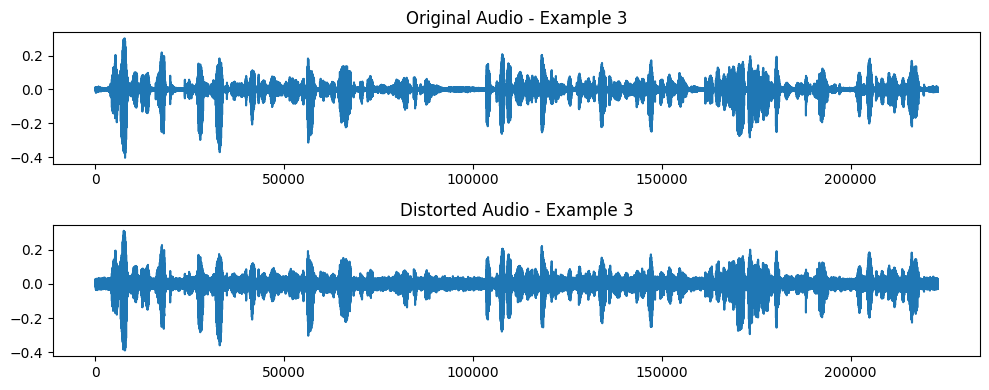


Original Audio - Example 3 (FOR NOT EVEN A BROOK COULD RUN PAST MISSUS RACHEL LYNDE'S DOOR WITHOUT DUE REGARD FOR DECENCY AND DECORUM IT PROBABLY WAS CONSCIOUS THAT MISSUS RACHEL WAS SITTING AT HER WINDOW KEEPING A SHARP EYE ON EVERYTHING THAT PASSED FROM BROOKS AND CHILDREN UP):



Distorted Audio - Example 3 (FOR NOT EVEN A BROOK COULD RUN PAST MISSUS RACHEL LYNDE'S DOOR WITHOUT DUE REGARD FOR DECENCY AND DECORUM IT PROBABLY WAS CONSCIOUS THAT MISSUS RACHEL WAS SITTING AT HER WINDOW KEEPING A SHARP EYE ON EVERYTHING THAT PASSED FROM BROOKS AND CHILDREN UP):



Example 4 - AND THAT IF SHE NOTICED ANYTHING ODD OR OUT OF PLACE SHE WOULD NEVER REST UNTIL SHE HAD FERRETED OUT THE WHYS AND WHEREFORES THEREOF THERE ARE PLENTY OF PEOPLE IN AVONLEA AND OUT OF IT WHO CAN ATTEND CLOSELY TO THEIR NEIGHBOR'S BUSINESS BY DINT OF NEGLECTING THEIR OWN:
Original Audio Shape: torch.Size([1, 235360])
Distorted Audio Shape: torch.Size([1, 235360])
Sample Rate: 16000
Original Predicted Tokens: [ 0  0  0  0  0  0  0  0  0  0  0  0  7  9  9 14  0  4  4  6 11  0  0  7
  6  0  4  0  0 10 20  4  4 12 12 11  5  5  4  4  4  0  9  0  8  0  0  6
  0  0 10 10 19 19  0  5 14  4  4  4  0  0  0  7  9  9  0  0 22  0  6 11
 11  0 10  9 21 21  4  4  0  0  0  0  0  0  8 14  0  0  0 14  0  4  4  0
  0  0  8 13 13  4  4  0  0  0  0  8 16  0  6  4  4  4  8 20  4  4  4  0
 23  0 15 15  0  0  0  0  0  7  0  0  0 19  5  0  4  4  4  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0 12 12 11 11  5  5  4  0 18  8
  8 16 15  0 14  4  4  4  0  9  0  5  0 25  0  5 13 13  4  4  0  0 

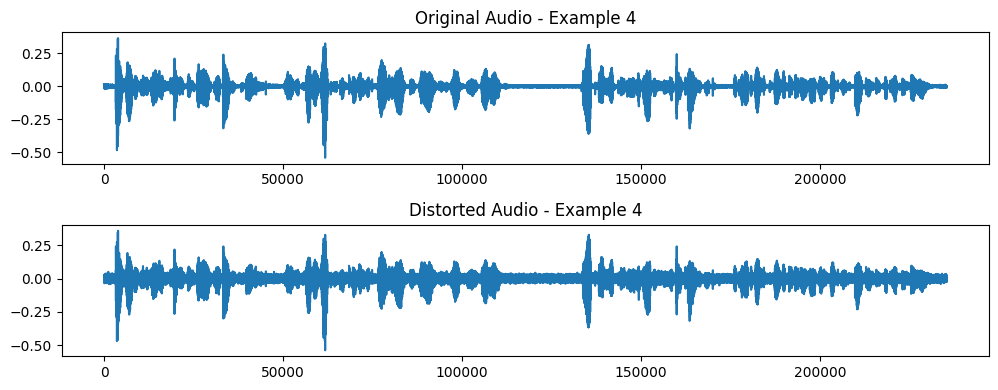


Original Audio - Example 4 (AND THAT IF SHE NOTICED ANYTHING ODD OR OUT OF PLACE SHE WOULD NEVER REST UNTIL SHE HAD FERRETED OUT THE WHYS AND WHEREFORES THEREOF THERE ARE PLENTY OF PEOPLE IN AVONLEA AND OUT OF IT WHO CAN ATTEND CLOSELY TO THEIR NEIGHBOR'S BUSINESS BY DINT OF NEGLECTING THEIR OWN):



Distorted Audio - Example 4 (AND THAT IF SHE NOTICED ANYTHING ODD OR OUT OF PLACE SHE WOULD NEVER REST UNTIL SHE HAD FERRETED OUT THE WHYS AND WHEREFORES THEREOF THERE ARE PLENTY OF PEOPLE IN AVONLEA AND OUT OF IT WHO CAN ATTEND CLOSELY TO THEIR NEIGHBOR'S BUSINESS BY DINT OF NEGLECTING THEIR OWN):



Example 5 - BUT MISSUS RACHEL LYNDE WAS ONE OF THOSE CAPABLE CREATURES WHO CAN MANAGE THEIR OWN CONCERNS AND THOSE OF OTHER FOLKS INTO THE BARGAIN SHE WAS A NOTABLE HOUSEWIFE HER WORK WAS ALWAYS DONE AND WELL DONE SHE RAN THE SEWING CIRCLE:
Original Audio Shape: torch.Size([1, 200240])
Distorted Audio Shape: torch.Size([1, 200240])
Sample Rate: 16000
Original Predicted Tokens: [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 24  0  0 16  0  6  4  4  0 17
 17 10 12 12  0  0 12 12 16 12 12 12  4  4  0 13 13  0  7  7  0 19 19 11
  0  5  5 15 15 15  4  4  4 15 15  0 22 22  9  9  0 14  5  5  4  4 18 18
  0  7 12 12  4  4  0  0  8  9  5  5  4  8  8 20  4  4  6 11  0  0  8 12
 12  5  4  4  4  0  0 19  0  0  0  0  7  7  0 23  0  0  0  7  0 24 24  0
 15 15  5  5  4  4  4  0  0  0 19 13 13  0  5  0  0  7  0  6  0  0  0 16
 13  5  5  0 12  4  4  4 18 11  0  8  4  4 19  0  0  7  9  0  4  4 17 17
  0  7  0  9  9  0  0  7  0 21  0  5  0  4  4  6 11 11  5 10 10 13  4  4
  0  0  8 18  0  9  9  4  4  0 19  

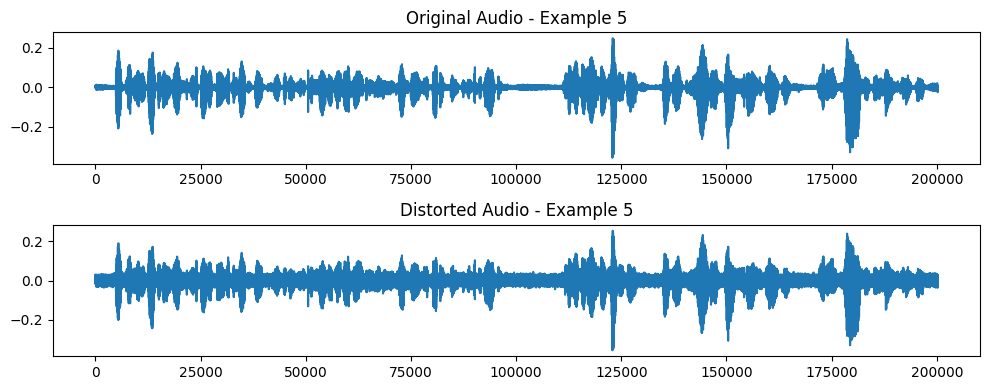


Original Audio - Example 5 (BUT MISSUS RACHEL LYNDE WAS ONE OF THOSE CAPABLE CREATURES WHO CAN MANAGE THEIR OWN CONCERNS AND THOSE OF OTHER FOLKS INTO THE BARGAIN SHE WAS A NOTABLE HOUSEWIFE HER WORK WAS ALWAYS DONE AND WELL DONE SHE RAN THE SEWING CIRCLE):



Distorted Audio - Example 5 (BUT MISSUS RACHEL LYNDE WAS ONE OF THOSE CAPABLE CREATURES WHO CAN MANAGE THEIR OWN CONCERNS AND THOSE OF OTHER FOLKS INTO THE BARGAIN SHE WAS A NOTABLE HOUSEWIFE HER WORK WAS ALWAYS DONE AND WELL DONE SHE RAN THE SEWING CIRCLE):


In [ ]:
import torch
import torchaudio
import torchaudio.transforms as T
from IPython.display import Audio, display
import matplotlib.pyplot as plt

# Initialize empty lists to store token IDs
original_token_ids_list = []
distorted_token_ids_list = []

# Set the noise level for distortion
noise_level = 0.01  # Adjust as needed

# Function to add distortion to audio waveform
def add_distortion(waveform, noise_level):
    noise = torch.randn_like(waveform) * noise_level
    return waveform + noise

# Loop through the first 3 examples in the dataset
for example_idx in range(5):
    # Choose an example from the dataset
    waveform, sample_rate, transcript, _, _, _ = librispeech_train[example_idx]

    # Tokenize original input audio
    original_input_values = tokenizer(waveform.numpy(), return_tensors="pt").input_values

    # Tokenize distorted input audio
    distorted_waveform = add_distortion(waveform, noise_level=noise_level)
    distorted_input_values = tokenizer(distorted_waveform.numpy(), return_tensors="pt").input_values

    # Forward pass through the model for original audio
    with torch.no_grad():
        original_logits = model(original_input_values).logits

    # Forward pass through the model for distorted audio
    with torch.no_grad():
        distorted_logits = model(distorted_input_values).logits

    # Get the predicted tokens for original and distorted audio
    original_predicted_ids = torch.argmax(original_logits, dim=-1)
    distorted_predicted_ids = torch.argmax(distorted_logits, dim=-1)

    # Decode the predicted tokens
    original_predicted_text = tokenizer.batch_decode(original_predicted_ids, skip_special_tokens=True)
    distorted_predicted_text = tokenizer.batch_decode(distorted_predicted_ids, skip_special_tokens=True)

    # Append token IDs to the lists
    original_token_ids_list.append(original_predicted_ids.squeeze().numpy())
    distorted_token_ids_list.append(distorted_predicted_ids.squeeze().numpy())

    # Print the results and display audio waveforms
    print(f"\nExample {example_idx + 1} - {transcript}:")
    print("Original Audio Shape:", waveform.shape)
    print("Distorted Audio Shape:", distorted_waveform.shape)
    print("Sample Rate:", sample_rate)
    print("Original Predicted Tokens:", original_predicted_ids.squeeze().numpy())
    print("Original Decoded Text:", original_predicted_text[0])
    print("Distorted Predicted Tokens:", distorted_predicted_ids.squeeze().numpy())
    print("Distorted Decoded Text:", distorted_predicted_text[0])

    # Display the original and distorted audio waveforms
    plt.figure(figsize=(10, 4))
    plt.subplot(2, 1, 1)
    plt.plot(waveform.numpy().squeeze())
    plt.title(f'Original Audio - Example {example_idx + 1}')

    plt.subplot(2, 1, 2)
    plt.plot(distorted_waveform.numpy().squeeze())
    plt.title(f'Distorted Audio - Example {example_idx + 1}')

    plt.tight_layout()
    plt.show()

    # Display the original and distorted audio with names
    print(f"\nOriginal Audio - Example {example_idx + 1} ({transcript}):")
    display(Audio(waveform.numpy().squeeze(), rate=sample_rate, autoplay=True))

    print(f"\nDistorted Audio - Example {example_idx + 1} ({transcript}):")
    display(Audio(distorted_waveform.numpy().squeeze(), rate=sample_rate, autoplay=True))

    # Save the distorted waveform as an audio file
    torchaudio.save(f'distorted_example_{example_idx + 1}.wav', distorted_waveform, sample_rate)

# Now you have access to the original and distorted token IDs in the lists: original_token_ids_list and distorted_token_ids_list.

In [ ]:
import difflib

def compare_transcripts(original_token_ids_list, distorted_token_ids_list):
    d = difflib.Differ()

    for idx in range(len(original_token_ids_list)):
        original_tokens = [str(token_id) for token_id in original_token_ids_list[idx]]
        distorted_tokens = [str(token_id) for token_id in distorted_token_ids_list[idx]]
        diff = list(d.compare(original_tokens, distorted_tokens))

        # Count the number of differences
        num_differences = sum(1 for item in diff if item.startswith('-') or item.startswith('+'))

        print(f"Example {idx + 1}: {num_differences} token differences")

# Example usage
compare_transcripts(original_token_ids_list, distorted_token_ids_list)

Example 1: 774 token differences
Example 2: 1208 token differences
Example 3: 1136 token differences
Example 4: 866 token differences
Example 5: 958 token differences


In [ ]:
pip install pyrubberband


  Preparing metadata (setup.py) ... done
  Created wheel for pyrubberband: filename=pyrubberband-0.3.0-py3-none-any.whl size=4264 sha256=6a949a2ef4a6a1580533049ef607dd5c8a9a08717595b3aa9f94c3869f9e7b35
  Stored in directory: /root/.cache/pip/wheels/b8/2d/f0/bb68fbfe67a42c858a79412321d28589218cbfe114c48ce664
Successfully built pyrubberband


In [ ]:
pip install torch-time-stretch

In [ ]:
import os
from scipy import signal
import pyrubberband as pyrb
import torch
import torchaudio
import torchaudio.transforms as T
from torch_time_stretch import time_stretch
import numpy as np
# import shutil
import tempfile
import subprocess
import soundfile as sf

def read_audio(filepath, fs=16000,  mono=True, normalize=False, preemphasis=False):
    """
    Reads audio file stored at <filepath>
    Parameters:
        filepath (str): audio file path
        fs (int, optional): samping rate
        mono (boolean, optional): return single channel
        normalize(boolean, optional): peak normalization of signal
        preemphasis (boolean, optional): apply pre-emphasis filter
    Returns:
        waveform (tensor): audio signal, dim(N,)
    """
    assert isinstance(filepath, str), "filepath must be specified as string"
    assert os.path.exists(filepath), f"{filepath} does not exist."

    try:
        waveform, sr = torchaudio.load(filepath)
        # mono channel
        if waveform.shape[0] == 2 and mono is True: waveform = waveform[0]
        else: waveform = waveform.reshape(-1)
        # preemphasis
        if preemphasis:
            waveform = pre_emphasis(waveform)
        # resample
        if sr != fs:
            resampler = T.Resample(sr, fs, dtype=waveform.dtype)
            waveform = resampler(waveform)
        # normalize
        if normalize:
            waveform = rms_normalize(waveform)
        return waveform
    except Exception as e:
        return None


def peak_normalize(waveform):
    """
    Peak normalizes the <waveform>
    Parameter:
        waveform (tensor): waveform, dims: (N,)
    """
    return waveform/torch.max(torch.abs(waveform))


def rms_normalize(waveform, r=-10):
    """
    RMS-normalization of  <waveform>
    Parameter:
        waveform (tensor): waveform, dims: (N,)
        rms (float): rms in dB
    """
    current_rms = torch.pow(torch.mean(torch.pow(waveform,2)) ,0.5)
    scaling_factor = (10**(r/10))/current_rms
    return waveform*scaling_factor


def pre_emphasis(waveform, coeff=0.97):
    filtered_sig = torch.empty_like(waveform)
    filtered_sig[1:] = waveform[1:] - coeff*waveform[:-1]
    filtered_sig[0] = waveform[0]
    return filtered_sig


def add_time_stretch(audio, fs, stretch_rate):
    """
    Adds time stretch to <clean> audio by <stretch_rate> factor.
    Parameters:
        audio (tensor): waveform, dims: (N,)
        fs (float): audio sample rate
        stretch_rate (float): playback rate
    Returns:
        audio_stretch (tensor): time stretched waveform dims: (N*<stretch_rate>,)

    """
    audio_stretch = time_stretch(audio.unsqueeze(0).unsqueeze(0), 1/stretch_rate, fs)
    # assert len(audio)/stretch_rate == len(audio_stretch), f"stretched audio length mismatch. Expected {len(audio)*stretch_rate}, got {len(audio_stretch)}"
    return audio_stretch.squeeze_()


def add_pitch_shift_rb(y, sr, shift, tmpdir=None):
    """
    Adds pitch shift to <y> audio sampled at <sr> by <shift> semitones. It calls rubberband package directly; does not use pyrubberband package.
    """
    if isinstance(y, np.ndarray) is False:
        y = y.numpy()

    if tmpdir is not None:
        tempfile.tempdir = tmpdir

    # Get the input and output tempfile
    fd, infile = tempfile.mkstemp(suffix='.wav')
    os.close(fd)
    fd, outfile = tempfile.mkstemp(suffix='.wav')
    os.close(fd)

    sf.write(infile, y, sr)
    command = ["rubberband", "-q", "--pitch", str(shift), infile, outfile]
    subprocess.run(command, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

    y_out, _ = sf.read(outfile, always_2d=True, dtype=y.dtype)
    if y.ndim == 1:
        y_out = np.squeeze(y_out)

    os.unlink(infile)
    os.unlink(outfile)
    return torch.from_numpy(y_out).type(torch.float32)


def add_pitch_shift(audio, fs, semitone_shift, use_rb=True):
    """
    Adds pitch shift to <clean> audio by <semitone_shit> semitones.
    Parameters:
        audio (tensor): clean waveform, dims: (N,)
        fs (float): audio sample rate
        semitone_shift (float): semitones (can be between -12 and 12, but keep it low for good sound quality)
    Returns:
        audio_shift: pitch shifted added signal (tensor), dims: (N,)

    """
    if use_rb:
        audio_shift = pyrb.pitch_shift(audio.numpy(), fs, semitone_shift)
        return torch.from_numpy(audio_shift).type(torch.float32)
    else:
        audio_shift = torchaudio.functional.pitch_shift(audio, fs, semitone_shift)
        return audio_shift

def add_noise(audio, noise, snr):
    """
    Adds background <noise> to <clean> signal at desired <SNR> level
    Parameters:
        audio (tensor): clean waveform, dims: (N,)
        noise (tensor): noise waveform, dims: (M,)
        snr (int): SNR level in dB
    Returns:
        noisy_audio: noisy signal (tensor), dims: (N,)
    """
    # make equal lengths for clean and noise signals
    if len(audio) >= len(noise):
        reps = torch.ceil(torch.tensor(len(audio)/len(noise))).int()
        noise = torch.tile(noise, (reps,))[:len(audio)]
    else:
        start_idx = torch.randint(len(noise) - len(audio), (1,))
        noise = noise[start_idx:start_idx+len(audio)]

    assert len(noise) == len(audio), f"noise signal {len(noise)} and clean signal {len(audio)} length mismatch"

    # add noise at desired snr
    audio_rms = torch.mean(torch.pow(audio, 2))
    noise_rms = torch.mean(torch.pow(noise, 2))
    factor = torch.pow((audio_rms/noise_rms)/torch.pow(torch.tensor(10), (snr/10)), 0.5)
    noise = factor*noise
    noisy_audio = audio + noise
    assert 10*torch.log10(audio_rms/torch.mean(torch.pow(noise, 2))) - snr < 1e-4, f"snr mismatch {10*torch.log10(audio_rms/torch.mean(torch.pow(noise, 2))), snr, len(audio), len(noise), audio_rms, torch.mean(torch.pow(noise, 2)), noise_rms, factor, audio, torch.count_nonzero(audio)}"
    return noisy_audio


def add_reverb(clean, rir):
    """
    Filters <clean> signal with <rir> to get reverberation effect
    Parameters:
        clean (tensor): clean waveform, dims: (N,)
        rir (tensor): room impulse response, dims: (M,)
    Returns:
        reverb added signal (tensor), dims: (N,)
    """
    clean = clean.numpy()
    rir = rir.numpy()
    rir = rir/np.linalg.norm(rir)
    # filering
    p_max = np.argmax(np.abs(rir))
    filtered_clean = signal.convolve(clean, rir, mode="full")

    # time offset
    e = np.empty_like(filtered_clean, dtype=np.float32)
    e[-p_max:] = 0.0
    e[:-p_max] = filtered_clean[p_max:]
    # filtered_clean = e.copy()
    # e=None
    filtered_clean = e[:len(clean)]
    assert(len(filtered_clean)==len(clean))
    filtered_clean = torch.from_numpy(filtered_clean)
    return filtered_clean


def add_noise_reverb(audio, noise, snr, rir):
    """
    Adds background <noise> at desired <snr> level and reveberation using <rir> to <clean> signal
    Parameters:
        audio (tensor): clean waveform, dims: (N,)
        noise (tensor): noise waveform, dims: (M,)
        snr (int): SNR level in dB
        rir (tensor): room impulse response, dims: (M,)
    Returns:
        noise and reverb added signal (tensor), dims: (N,)
    """
    audio_reverb = add_reverb(audio, rir)
    noise_reverb = add_reverb(noise, rir)
    noise_reverb_clean = add_noise(audio_reverb, noise_reverb, snr)
    return noise_reverb_clean



ModuleNotFoundError: No module named 'pyrubberband'

In [ ]:
import torchaudio

librispeech_test = torchaudio.datasets.LIBRISPEECH(".", url="test-clean", download=True)

100%|██████████| 331M/331M [00:21<00:00, 15.9MB/s]


In [ ]:
import torchaudio
import random
import torch
import csv

# Noise file path
noise_file_path = "/content/Traffic.wav"

# Select one audio file from the LibriSpeech dataset
# Here we assume you have a variable named 'librispeech_test' containing the dataset
audio_file_path, _ = random.choice(librispeech_test)

# Load the selected audio file
clean_audio, _ = torchaudio.load(audio_file_path)

# Load the noise audio file
noise_audio, _ = torchaudio.load(noise_file_path)

# SNR levels to test
snr_levels = [0, 5, 10]

# List to store the results
results = []

# Function to transcribe audio using Wav2Vec2 model and tokenizer
def transcribe_audio(audio):
    input_values = tokenizer(audio, return_tensors="pt").input_values
    logits = model(input_values).logits
    predicted_ids = torch.argmax(logits, dim=-1)
    return predicted_ids

# Iterate over SNR levels
for snr in snr_levels:
    # Apply noise to the clean audio
    noisy_audio = add_noise(clean_audio, noise_audio, snr)

    # Transcribe noisy audio
    predicted_ids_clean = transcribe_audio(clean_audio)
    predicted_ids_noisy = transcribe_audio(noisy_audio)

    # Count changed predicted IDs
    num_changed_tokens = torch.sum(predicted_ids_clean != predicted_ids_noisy)

    # Append results to the list
    results.append({'SNR': snr, 'Changed Tokens': num_changed_tokens.item()})

# Write results to CSV file
with open('changed_tokens.csv', mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['SNR', 'Changed Tokens'])
    writer.writeheader()
    writer.writerows(results)


ValueError: too many values to unpack (expected 2)

In [ ]:
import random
import torch
import csv

# Noise file path
noise_file_path = "/content/Traffic.wav"

# List of audio file paths in the LibriSpeech dataset
audio_file_paths = [item[0] for item in librispeech_test]

# Randomly select 1000 audio files from the LibriSpeech dataset
selected_audio_files = random.sample(audio_file_paths, 1000)

# SNR levels to test
snr_levels = [0, 5, 10]

# List to store the results
results = []

# Function to transcribe audio using Wav2Vec2 model and tokenizer
def transcribe_audio(audio):
    input_values = tokenizer(audio, return_tensors="pt").input_values
    logits = model(input_values).logits
    predicted_ids = torch.argmax(logits, dim=-1)
    return predicted_ids

# Load noise audio
noise_audio, _ = torchaudio.load(noise_file_path)

# Iterate over selected audio files
for file_number, audio_file_path in enumerate(selected_audio_files):
    # Load clean audio
    clean_audio, _ = torchaudio.load(audio_file_path)

    # Iterate over SNR levels
    for snr in snr_levels:
        # Apply noise
        noisy_audio = add_noise(clean_audio, noise_audio, snr)

        # Transcribe noisy audio
        predicted_ids_clean = transcribe_audio(clean_audio)
        predicted_ids_noisy = transcribe_audio(noisy_audio)

        # Count changed predicted IDs
        num_changed_tokens = torch.sum(predicted_ids_clean != predicted_ids_noisy)

        # Append results to the list
        results.append({'File Number': file_number, 'Changed Tokens': num_changed_tokens.item(), 'SNR': snr})

# Write results to CSV file
with open('changed_tokens.csv', mode='w', newline='') as file:
    writer = csv.DictWriter(file, fieldnames=['File Number', 'Changed Tokens', 'SNR'])
    writer.writeheader()
    writer.writerows(results)


TypeError: expected str, bytes or os.PathLike object, not Tensor

In [ ]:

def add_noise(audio, noise, snr):
    """
    Adds background <noise> to <clean> signal at desired <SNR> level
    Parameters:
        audio (tensor): clean waveform, dims: (N,)
        noise (tensor): noise waveform, dims: (M,)
        snr (int): SNR level in dB
    Returns:
        noisy_audio: noisy signal (tensor), dims: (N,)
    """
    # make equal lengths for clean and noise signals
    if len(audio) >= len(noise):
        reps = torch.ceil(torch.tensor(len(audio)/len(noise))).int()
        noise = torch.tile(noise, (reps,))[:len(audio)]
    else:
        start_idx = torch.randint(len(noise) - len(audio), (1,))
        noise = noise[start_idx:start_idx+len(audio)]
    assert len(noise) == len(audio), f"noise signal {len(noise)} and clean signal {len(audio)} length mismatch"

    # add noise at desired snr
    audio_rms = torch.mean(torch.pow(audio, 2))
    noise_rms = torch.mean(torch.pow(noise, 2))
    factor = torch.pow((audio_rms/noise_rms)/torch.pow(torch.tensor(10), (snr/10)), 0.5)
    noise = factor*noise
    noisy_audio = audio + noise
    assert 10*torch.log10(audio_rms/torch.mean(torch.pow(noise, 2))) - snr < 1e-4, f"snr mismatch {10*torch.log10(audio_rms/torch.mean(torch.pow(noise, 2))), snr, len(audio), len(noise), audio_rms, torch.mean(torch.pow(noise, 2)), noise_rms, factor, audio, torch.count_nonzero(audio)}"
    return noisy_audio


def read_audio(filepath, fs=16000,  mono=True, normalize=False, preemphasis=False):
    """
    Reads audio file stored at <filepath>
    Parameters:
        filepath (str): audio file path
        fs (int, optional): samping rate
        mono (boolean, optional): return single channel
        normalize(boolean, optional): peak normalization of signal
        preemphasis (boolean, optional): apply pre-emphasis filter
    Returns:
        waveform (tensor): audio signal, dim(N,)
    """
    assert isinstance(filepath, str), "filepath must be specified as string"
    assert os.path.exists(filepath), f"{filepath} does not exist."

    try:
        waveform, sr = torchaudio.load(filepath)
        # mono channel
        if waveform.shape[0] == 2 and mono is True: waveform = waveform[0]
        else: waveform = waveform.reshape(-1)
        # preemphasis
        if preemphasis:
            waveform = pre_emphasis(waveform)
        # resample
        if sr != fs:
            resampler = T.Resample(sr, fs, dtype=waveform.dtype)
            waveform = resampler(waveform)
        # normalize
        if normalize:
            waveform = rms_normalize(waveform)
        return waveform
    except Exception as e:
        return None

In [ ]:
clean_audio = read_audio("/content/LibriSpeech/test-clean/1089/134686/1089-134686-0000.flac")
noise_audio = read_audio("/content/Traffic.wav")
snr=10

In [ ]:
noisy_audio = add_noise(clean_audio, noise_audio, snr)

()